In [92]:
import os
import datetime

import numpy as np
import pandas as pd

from pyproj import Transformer
import geopandas as gpd
from shapely.geometry import Point
import movingpandas as mpd

import matplotlib.pyplot as plt
import matplotlib as mlp
import scienceplots
plt.style.use("science")
import seaborn as sns

import folium as fl
from folium.plugins import FastMarkerCluster

from IPython.core.display_functions import clear_output

# Load Data

In [2]:
df = pd.read_csv("../data/1_miami_data.csv")

In [3]:
df.head()

,BaseDateTime,LON,LAT,SOG,COG,Status,vessel
0,2021-02-18 19:49:02,-78.91242,22.90467,13.5,271.7,0.0,1
1,2021-02-18 19:53:46,-78.92096,22.92118,14.1,288.3,0.0,1
2,2021-02-18 20:00:45,-78.93176,22.94673,14.1,287.7,0.0,1
3,2021-02-18 20:03:22,-78.93592,22.95611,14.0,289.8,0.0,1
4,2021-02-18 20:05:10,-78.93882,22.96262,14.0,287.1,0.0,1


# Navigational Status Inconsistency

In [4]:
ais_inconsistent_status = df.loc[(df["Status"] == 5) & (df["SOG"] >= 1), ["LAT", "LON", "SOG"]]
ais_inconsistent_status_points = gpd.points_from_xy(ais_inconsistent_status["LON"],
                                                    ais_inconsistent_status["LAT"],
                                                    crs=4326)
gdf_ais_inconsistent_status = gpd.GeoDataFrame(ais_inconsistent_status,
                                               geometry=ais_inconsistent_status_points)

/var/folders/20/m3t9trt177390cx_80yzc8wc0000gn/T/ipykernel_5183/1865896258.py:2: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


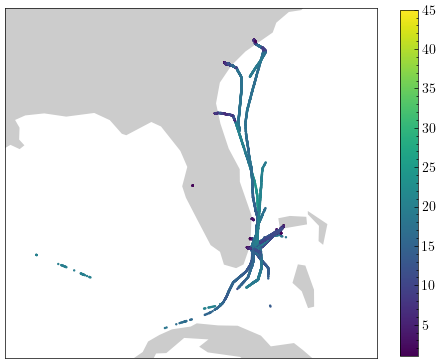

In [5]:
fig, ax = plt.subplots(figsize=(6, 6))
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
world.plot(ax=ax, alpha=0.4, color="grey")

legend_kwds = {
    "orientation": "vertical",
    "shrink": 0.75#,
    #"label": "Speed Over Ground (SOG)"
}
gdf_ais_inconsistent_status.plot(column="SOG", markersize=0.5, ax=ax,
                                 legend=True, legend_kwds=legend_kwds)
plt.xlim([-90, -75])
plt.ylim([22, 34])
plt.xticks(ticks=[], labels=[])
plt.yticks(ticks=[], labels=[])

plt.savefig("../figures/tese/metodos/nav_status_inconsistency_miami")
plt.show()

# Split Voyages

In [6]:
miami_ct_coords = [25.77, -80.16]

m = fl.Map(location=miami_ct_coords, zoom_start=11)

# considerei um círculo em vez de um polígono de raio 6 milhas
# pois o autor diz que elimina os pontos que estão a menos de 6 milhas
# para remover dados relativos a manobras no porto
# e aumentar a precisão das previsões
fl.Circle(location=miami_ct_coords, radius=3000).add_to(m)

moored_points = df.loc[(df["Status"] == 5) & (df["SOG"] < 1.0), ["LAT", "LON"]]

fmc = FastMarkerCluster(data=moored_points.values)
fmc.add_to(m)

m

In [7]:
# ----- Miami anchored points plot -----
miami_anchor_coords = [25.79, -80.085]

m = fl.Map(location=miami_ct_coords, zoom_start=11)

fl.Circle(location=miami_anchor_coords, radius=3000).add_to(m)

anchored_points = df.loc[(df["Status"] == 1) & (df["SOG"] < 5.0), ["LAT", "LON"]]

fmc = FastMarkerCluster(data=anchored_points.values)
fmc.add_to(m)

m

In [32]:
df_clean = df.copy()

In [33]:
transformer = Transformer.from_crs(4326, 3857)
x, y = transformer.transform(df_clean["LAT"].to_numpy(), df_clean["LON"].to_numpy())

In [34]:
df_clean = df_clean.assign(x=x)
df_clean = df_clean.assign(y=y)

In [35]:
# Get the distance of each point to the port (defined by the quay point)
quay_point = Point(transformer.transform(miami_ct_coords[0], miami_ct_coords[1]))
distanceToPort = gpd.points_from_xy(df_clean.x, df_clean.y, crs=3857).distance(quay_point)
df_clean = df_clean.assign(distanceToPort=distanceToPort)

In [36]:
# Get arrival point (first point within 4km of the quay center with
# Status = 5 and SOG < 1 knot)
df_clean["arrival_point"] = 0
df_clean.loc[(df_clean["distanceToPort"] < 3000)
             & (df_clean["Status"] == 5)
             & (df_clean["SOG"] < 1), "arrival_point"] = 1
points_after_arrival = (df_clean["arrival_point"].diff() != 1) \
                       & (df_clean["arrival_point"] == 1)
df_clean = df_clean.loc[~points_after_arrival, :]
df_clean.reset_index(drop=True, inplace=True)

In [37]:
# Enumerate voyages (where arrival_point = 1 subtract 1)
voyage = pd.Series(data=df_clean.groupby("vessel")["arrival_point"].cumsum().values)
df_clean = df_clean.assign(voyage=voyage)
df_clean.loc[df_clean["arrival_point"] == 1, "voyage"] -= 1

In [38]:
# Build vessel-voyage pairs (voyage ids)
voyage_id = df_clean["vessel"].astype(str) + "-" \
            + df_clean["voyage"].astype(str)
df_clean = df_clean.assign(voyage_id=voyage_id)

In [39]:
df_clean["BaseDateTime"] = pd.to_datetime(df_clean["BaseDateTime"])

In [40]:
# Get the remaining time from each msg to the arrival message (remaining voyage time)
remainingVoyageTime = df_clean.groupby("voyage_id") \
    .apply(lambda x: x.iloc[-1]["BaseDateTime"] - x.loc[:, "BaseDateTime"]) \
    .sort_index(level=1).dt.total_seconds() / 60
remainingVoyageTime = pd.Series(remainingVoyageTime.values)
df_clean = df_clean.assign(remainingVoyageTime=remainingVoyageTime)

In [41]:
# Take only msgs within 2 days of a vessel's arrival
df_clean = df_clean.loc[df_clean["remainingVoyageTime"] <= 48*60]

In [42]:
df_arrivals = df_clean.groupby("voyage_id", group_keys=False, sort=False)[["voyage_id", "BaseDateTime", "LON", "LAT"]].tail(1)

In [43]:
df_arrivals.to_csv("../data/miami_voyages_arrivals.csv", index=False)

In [44]:
# Take only points at least 10 Km from the terminal location
df_clean = df_clean.loc[df_clean["distanceToPort"] >= 10000]

In [45]:
# Convert distance in meters to nautical miles
df_clean["distanceToPort"] *= 0.000539956803

In [46]:
miami_ct_coords = [25.77, -80.16]

m = fl.Map(location=miami_ct_coords, zoom_start=8)

moored_points = df_clean.loc[(df_clean["Status"] == 5)
                             & (df_clean["SOG"] < 1.0), ["LAT", "LON"]]

fmc = FastMarkerCluster(data=moored_points.values)
fmc.add_to(m)

m

In [47]:
miami_anchor_coords = [25.79, -80.085]

m = fl.Map(location=miami_ct_coords, zoom_start=8)

anchored_points = df_clean.loc[(df_clean["Status"] == 1)
                               & (df_clean["SOG"] < 5.0), ["LAT", "LON"]]

fmc = FastMarkerCluster(data=anchored_points.values)
fmc.add_to(m)

m

In [48]:
# Remove messages until vessels leave the last port

    # Moored points
df_clean = df_clean.groupby("voyage_id")\
    .apply(lambda x: x if x.loc[(x["Status"] == 5)
                                & (x["SOG"] < 1), "BaseDateTime"].max() is pd.NaT
                        else x[x["BaseDateTime"]
                               > (x.loc[(x["Status"] == 5)
                                        & (x["SOG"] < 1), "BaseDateTime"].max())])\
    .sort_index(level=1).reset_index(drop=True)

    # Anchored points
df_clean = df_clean.groupby("voyage_id") \
    .apply(lambda x: x if x.loc[(x["Status"] == 1)
                                & (x["SOG"] < 5), "BaseDateTime"].max() is pd.NaT
else x[x["BaseDateTime"]
       > (x.loc[(x["Status"] == 1)
                & (x["SOG"] < 5), "BaseDateTime"].max())]) \
    .sort_index(level=1).reset_index(drop=True)

In [49]:
# Remove voyages with less than 100 msgs
invalid_voyages = df_clean["voyage_id"].value_counts() < 100
invalid_voyages = invalid_voyages[invalid_voyages].index.values
df_clean = df_clean.loc[~df_clean["voyage_id"].isin(invalid_voyages)]

In [50]:
df_clean["voyage_id"].unique().shape

(1359,)

In [51]:
df_clean["vessel"].unique().shape

(268,)

# Visualize voyages

In [ ]:
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"), crs="EPSG:4326")
north_america = world.query("continent == 'North America'")

voyages_to_remove = ["13-3", "146-20", "168-8", "170-1", "208-0", "209-8", "226-3",  "236-3", "237-0", "243-2", "244-1", "244-2", "26-25", "270-0", "270-2", "23-115", "23-12", "23-30", "23-41", "23-49", "23-63", "23-68", "23-96"]

for voyage_id, voyage_data in df_clean.groupby("voyage_id"):

    if voyage_id not in voyages_to_remove:
        continue

    trajectory = mpd.Trajectory(df=voyage_data,
                                traj_id=voyage_id,
                                t="BaseDateTime",
                                x="LON", y="LAT")

    fig, ax = plt.subplots(figsize=(5, 5))
    north_america.plot(ax=ax, color="white", edgecolor="black")
    trajectory.plot(ax=ax)

    ax.set_xlim([voyage_data["LON"].min() - 3, voyage_data["LON"].max() + 3])
    ax.set_ylim([voyage_data["LAT"].min() - 3, voyage_data["LAT"].max() + 3])
    ax.set_title(f"Voyage {voyage_id}")
    plt.show()

    clear_output(wait=True)
    plt.pause(5)

/var/folders/20/m3t9trt177390cx_80yzc8wc0000gn/T/ipykernel_5183/2218379922.py:6: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"), crs="EPSG:4326")


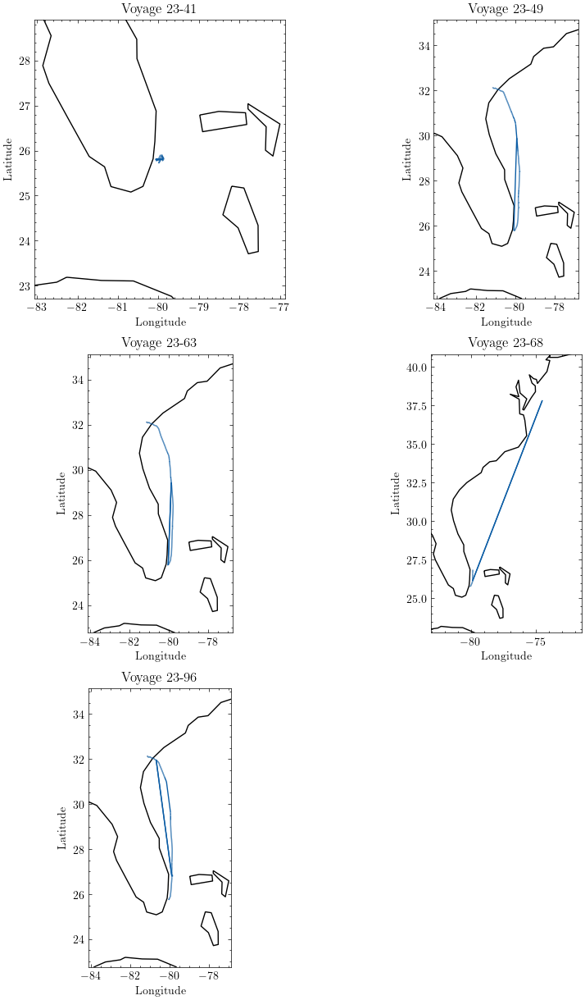

In [78]:
voyages_to_remove = ["13-3", "146-20", "168-8", "170-1", "208-0", "209-8",
                     "226-3",  "236-3", "237-0", "243-2", "244-1", "244-2",
                     "26-25", "270-0", "270-2", "23-115", "23-12", "23-30",
                     "23-41", "23-49", "23-63", "23-68", "23-96"]

world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"), crs="EPSG:4326")
north_america = world.query("continent == 'North America'")

fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(10, 15))

j = 0
for i in range(0, 6):

    voyage_data = df_clean.loc[df_clean["voyage_id"] == voyages_to_remove[i+j],
                               ["voyage_id", "BaseDateTime", "LON", "LAT"]]
    
    trajectory = mpd.Trajectory(df=voyage_data,
                                traj_id="voyage_id",
                                t="BaseDateTime",
                                x="LON", y="LAT")

    north_america.plot(ax=axs[i//2, i%2], color="white", edgecolor="black")
    trajectory.plot(ax=axs[i//2, i%2])
    axs[i//2, i%2].set_xlim([voyage_data["LON"].min() - 3, voyage_data["LON"].max() + 3])
    axs[i//2, i%2].set_ylim([voyage_data["LAT"].min() - 3, voyage_data["LAT"].max() + 3])
    axs[i//2, i%2].set_title(f"Voyage {voyage_data['voyage_id'].values[0]}")
    axs[i//2, i%2].set_ylabel("Latitude")
    axs[i//2, i%2].set_xlabel("Longitude")

#axs[2, 1].remove()
plt.savefig("../figures/tese/metodos/app_rem_voyages_1")
plt.show()

In [79]:
df_clean = df_clean[~df_clean["voyage_id"].isin(voyages_to_remove)]

In [80]:
df_clean["voyage_id"].unique().shape

(1336,)

In [81]:
df_clean["vessel"].unique().shape

(267,)

/var/folders/20/m3t9trt177390cx_80yzc8wc0000gn/T/ipykernel_5183/2639316892.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"), crs="EPSG:4326")
/var/folders/20/m3t9trt177390cx_80yzc8wc0000gn/T/ipykernel_5183/2639316892.py:14: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, shrink=0.85)


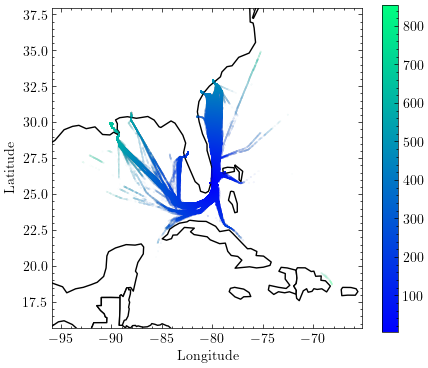

In [98]:
world = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"), crs="EPSG:4326")
north_america = world.query("continent == 'North America'")

cmap = mlp.colormaps.get_cmap("winter")

fig, ax = plt.subplots(figsize=(5,5))
north_america.plot(ax=ax, color="white", edgecolor="black")

dist_norm = (df_clean["distanceToPort"] - df_clean["distanceToPort"].min()) \
            / (df_clean["distanceToPort"].max() - df_clean["distanceToPort"].min())

sm = plt.cm.ScalarMappable(cmap=cmap)
sm.set_array(df_clean["distanceToPort"])
cbar = plt.colorbar(sm, shrink=0.85)

ax.scatter(df_clean["LON"], df_clean["LAT"], c=cmap(dist_norm), s=0.0001)

ax.set_xlim([df_clean["LON"].min() - 3, df_clean["LON"].max() + 3])
ax.set_ylim([df_clean["LAT"].min() - 3, df_clean["LAT"].max() + 3])
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")

plt.savefig("../figures/tese/metodos/final_miami_data")
plt.show()

In [ ]:
df_clean = df_clean[["vessel", "voyage", "voyage_id",
                     "BaseDateTime", "LON", "LAT", "SOG", "COG",
                     "distanceToPort", "remainingVoyageTime",
                     "x", "y"]]

In [ ]:
df_clean.head()

In [ ]:
df_clean.info()

In [ ]:
df_clean.to_csv("../data/2_miami_voyages.csv", index=False)